<a href="https://colab.research.google.com/github/manglesh001/DSAP/blob/main/FaceRecognisationUsingPCA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# SMAI Assignment - 2

## Question 3: Face Recognition using Principal Component Analysis

This question requires you to create a basic facial recognition system using a technique called principal component analysis (PCA)
by projecting the face images on the feature space (face space) which best
represents the variations among distinct faces. The face space is defined as the
“Eigenfaces", which are the eigenvectors of the set of faces.

The goal of implementing this system is to recognize a person's face by comparing it to a pre-existing database of faces, and identifying the closest match.

Link to paper on Eigenfaces: [https://sites.cs.ucsb.edu/~mturk/Papers/mturk-CVPR91.pdf](https://sites.cs.ucsb.edu/~mturk/Papers/mturk-CVPR91.pdf)

The AT&T face dataset contains a set of grayscale face images with dimensions 92x112. The images are organised in 40 directories (one for each subject), which have names of the form sX, where X indicates the subject number (between 1 and 40). In each of these directories, there are ten different images of that subject, which have names of the form Y.pgm, where Y is the image number for that subject (between 1 and 10). These 10 images per person are taken at different times, varying the lighting, facial expressions (open / closed eyes, smiling / not smiling) and facial details (glasses / no glasses). All the images were taken against a dark homogeneous background with the subjects in an upright, frontal position (with tolerance for some side movement). <b>Link:</b> [https://git-disl.github.io/GTDLBench/datasets/att_face_dataset/](https://git-disl.github.io/GTDLBench/datasets/att_face_dataset/)

#### Tasks
1. Load dataset and divide the date into training and test sets.
2. Implement the PCA algorithm from scratch.
3. Implement image reconstruction using the eigen projections and visualise differences for different number of components.
4. Visualise the mean(Eigen face) generated.
5. Given training set, obtain accuracy by attempting a face regonition module and obtaining the accuracy for different number of principal components.

#### Import Libraries

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os, sys
import cv2
from copy import copy
from tqdm import tqdm

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd drive/MyDrive


/content/drive/MyDrive


In [ ]:
ls

 ATnT/  'Colab Notebooks'/   my_model.pt   ud-treebanks-v2.13/


#### Import Dataset
Assign labels for the images based on the subdirectories to obtain X(images array) and y (labels).

Ensure that the test data contains atleast one image from each category.

In [ ]:
# iterate through all folders, load each image

trainAmt = 0.9
allFaces = []
labels = []

for i in range(1,41):
    for j in range(1,11):
        imgPath = os.path.join("/content/drive/MyDrive/ATnT", "s" + str(i), str(j) + ".pgm")
        img = cv2.imread(imgPath, -1)

        allFaces.append(img)
        labels.append(i)

# shuffle
randomOrder = np.random.permutation(len(labels))
allFaces = np.array(allFaces)[randomOrder]
labels = np.array(labels)[randomOrder]

# split
trainFaces = allFaces[:int(trainAmt*len(allFaces))]
trainLabels = labels[:int(trainAmt*len(allFaces))]

testFaces = allFaces[int(trainAmt*len(allFaces)): ]
testLabels = labels[int(trainAmt*len(allFaces)): ]

# 112x92 (= 10304) grayscale images,  360 in train, 40 in test
print(trainFaces.shape, trainLabels.shape)

(360, 112, 92) (360,)


#### Implement PCA Algorithm.

Explain your steps with comments and write a brief explanation of the method.

In [ ]:
def principalComponentAnalysis(X, numComponents):
    """
    Implement pca in the following function by taking the following arguements:
    1. X(images array)
    2. number of components
    The function must return the eigen vectors (principal components) also termed "Eigen faces"
    """

    X_flat = X.reshape(X.shape[0], -1)


    mean_face = np.mean(X_flat, axis=0)

    X_centered = X_flat - mean_face

    covariance_matrix = np.cov(X_centered, rowvar=False)

    eigenvalues, eigenvectors = np.linalg.eigh(covariance_matrix)

    sorted_indices = np.argsort(eigenvalues)[::-1]
    sorted_eigenvalues = eigenvalues[sorted_indices]
    sorted_eigenvectors = eigenvectors[:, sorted_indices]

    eigen_faces = sorted_eigenvectors[:, :numComponents]

    return eigen_faces, mean_face



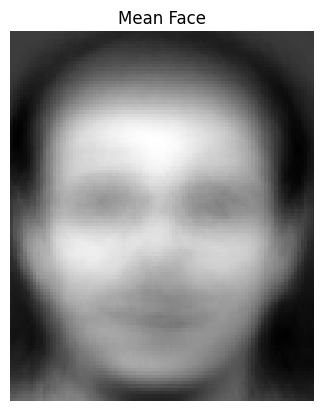

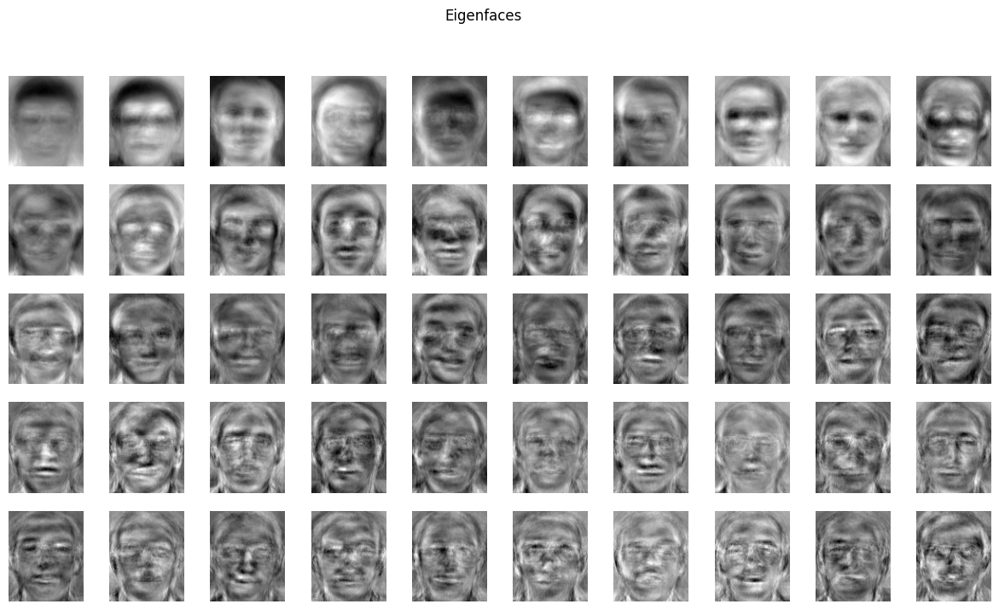

In [ ]:
# plot the eigen faces
# Define the number of components for PCA
num_components = 50

# Perform PCA on training faces
eigen_faces, mean_face = principalComponentAnalysis(trainFaces, num_components)

# Visualize the mean (average) face
plt.imshow(mean_face.reshape(112, 92), cmap='gray')
plt.title('Mean Face')
plt.axis('off')
plt.show()

# Visualize some eigenfaces
fig, axes = plt.subplots(5, 10, figsize=(15, 8))

for i in range(5):
    for j in range(10):
        ax = axes[i, j]
        ax.imshow(eigen_faces[:, i * 10 + j].reshape(112, 92), cmap='gray')
        ax.axis('off')

plt.suptitle('Eigenfaces')
plt.show()


#### Implement Image Reconstruction from Eigenfaces


Explain your steps with comments and write a brief explanation of the method.

In [ ]:

def imageReconstruction(testFace, eigenFaces, meanFace):
    """
    Helper function to reconstruct images
    """

    testFace_flat = testFace.reshape(-1)


    diff = testFace_flat - meanFace


    weights = np.dot(diff, eigenFaces)


    reconstructed_face = meanFace + np.dot(weights, eigenFaces.T)

    return reconstructed_face

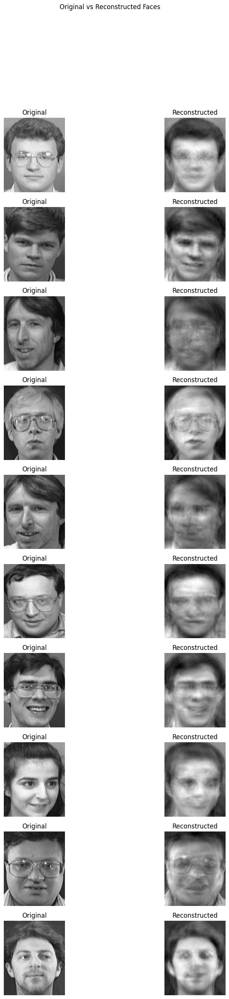

In [ ]:

num_reconstructions = 10
fig, axes = plt.subplots(num_reconstructions, 2, figsize=(10, 3 * num_reconstructions))

for i in range(num_reconstructions):

    test_index = i * 3  # Adjust this multiplication factor if needed
    if test_index < len(testFaces):
        test_face = testFaces[test_index]
        reconstructed_face = imageReconstruction(test_face, eigen_faces, mean_face)
        axes[i, 0].imshow(test_face, cmap='gray')
        axes[i, 0].set_title('Original')
        axes[i, 1].imshow(reconstructed_face.reshape(112, 92), cmap='gray')
        axes[i, 1].set_title('Reconstructed')
        axes[i, 0].axis('off')
        axes[i, 1].axis('off')
    else:

        break

plt.suptitle('Original vs Reconstructed Faces')
plt.show()

#### Visualisation
Visualise the results for different number of factors(pc = 5, 10, 50, 100, etc.)

**Note:** Ensure that the images are labelled appropriately.

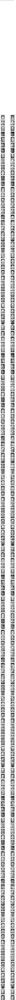

In [ ]:
%matplotlib inline
def displayNfactors(testFaces, eigen_faces, mean_face, num_components_list):
    """
    Visualize the results for different numbers of factors (principal components).
    """
    num_reconstructions = len(testFaces)
    num_factors = len(num_components_list)

    fig, axes = plt.subplots(num_reconstructions * num_factors, 2, figsize=(10, 3 * num_reconstructions * num_factors))

    for i, num_components in enumerate(num_components_list):
        eigen_faces, mean_face = principalComponentAnalysis(trainFaces, num_components)

        for j in range(num_reconstructions):
            test_face = testFaces[j]

            reconstructed_face = imageReconstruction(test_face, eigen_faces, mean_face)
            axes[i * num_reconstructions + j, 0].imshow(test_face, cmap='gray')
            axes[i * num_reconstructions + j, 0].set_title(f'Original - {num_components} Components')
            axes[i * num_reconstructions + j, 1].imshow(reconstructed_face.reshape(112, 92), cmap='gray')
            axes[i * num_reconstructions + j, 1].set_title(f'Reconstructed - {num_components} Components')
            axes[i * num_reconstructions + j, 0].axis('off')
            axes[i * num_reconstructions + j, 1].axis('off')

    plt.suptitle('Original vs Reconstructed Faces for Different Numbers of Components')
    plt.show()


num_components_list = [5, 10, 50, 100]

displayNfactors(testFaces, eigen_faces, mean_face, num_components_list)




#### Implement face recognition module based on the norm
Explain your steps with comments and write a brief explanation of the method.

*   Test the module and report accuracies based on the number of components taken for a range of value and plot them.
*   Also plot the mean square error vs the number of eigenvectors taken and report your observations.
*   For further empirical analysis, plot the semi-log variant of the error plot obtained above.

In [ ]:
def getClass(test_image, eigen_faces, mean_face, X_train, y_train):
    """
    Arguments:
    1. test_image: Test image to be classified
    2. eigen_faces: Eigenfaces obtained from PCA
    3. mean_face: Mean Eigen Face
    4. X_train: Training set images
    5. y_train: Labels corresponding to the training set images

    The function returns:
    1. image with the smallest error
    2. error value
    3. predicted class
    """

    test_face_flat = test_image.reshape(-1)

    diff = test_face_flat - mean_face

    weights = np.dot(diff, eigen_faces)
    reconstructed_face = mean_face + np.dot(weights, eigen_faces.T)
    errors = np.linalg.norm(X_train.reshape(X_train.shape[0], -1) - reconstructed_face, axis=1)
    min_error_index = np.argmin(errors)
    predicted_class = y_train[min_error_index]
    return X_train[min_error_index], errors[min_error_index], predicted_class

Iterate through all the images in the test data and test the accuracy by taking different number of components

Accuracy for 3 components: 0.15
Accuracy for 5 components: 0.325
Accuracy for 10 components: 0.725
Accuracy for 20 components: 0.9
Accuracy for 30 components: 0.9
Accuracy for 40 components: 0.925
Accuracy for 50 components: 0.925


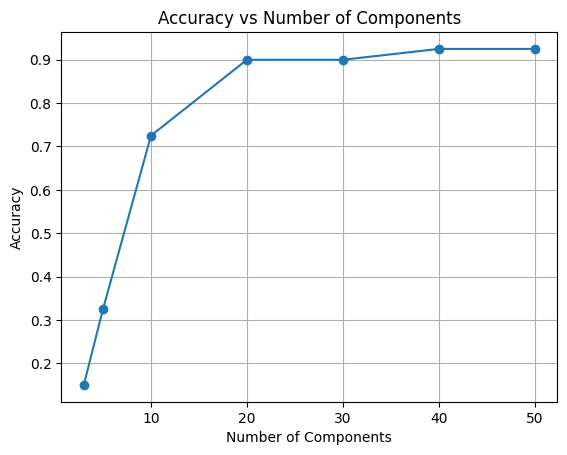

In [ ]:
components = [3, 5, 10, 20, 30, 40, 50]
accuracies = []

for numComponents in components:

    eigen_faces, mean_face = principalComponentAnalysis(trainFaces, numComponents)

    correct_predictions = 0
    total_images = len(testFaces)

    for i in range(total_images):

        closest_image, error, predicted_class = getClass(testFaces[i], eigen_faces, mean_face, trainFaces, trainLabels)


        if predicted_class == testLabels[i]:
            correct_predictions += 1


    accuracy = correct_predictions / total_images
    accuracies.append(accuracy)
    print(f"Accuracy for {numComponents} components: {accuracy}")

plt.plot(components, accuracies, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Accuracy')
plt.title('Accuracy vs Number of Components')
plt.grid(True)
plt.show()

Plot Number of eigenvectors vs Mean Square Error

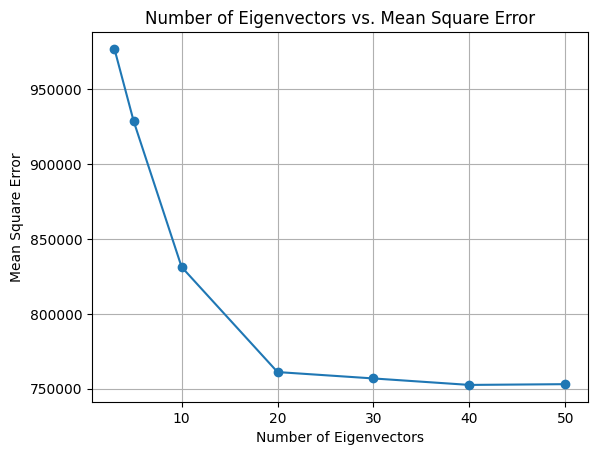

In [ ]:
# your code here
components = [3, 5, 10, 20, 30, 40, 50]

mse = []

for numComponents in components:
    eigen_faces, mean_face = principalComponentAnalysis(trainFaces, numComponents)

    total_squared_error = 0

    for i in range(len(testFaces)):
        closest_image, error, predicted_class = getClass(testFaces[i], eigen_faces, mean_face, trainFaces, trainLabels)

        squared_error = np.sum((testFaces[i].flatten() - closest_image.flatten()) ** 2)

        total_squared_error += squared_error

    mean_squared_error = total_squared_error / len(testFaces)
    mse.append(mean_squared_error)

plt.plot(components, mse, marker='o')
plt.xlabel('Number of Eigenvectors')
plt.ylabel('Mean Square Error')
plt.title('Number of Eigenvectors vs. Mean Square Error')
plt.grid(True)
plt.show()



\\Plot Number of eigenvectors vs Logarithmic Mean Square Error

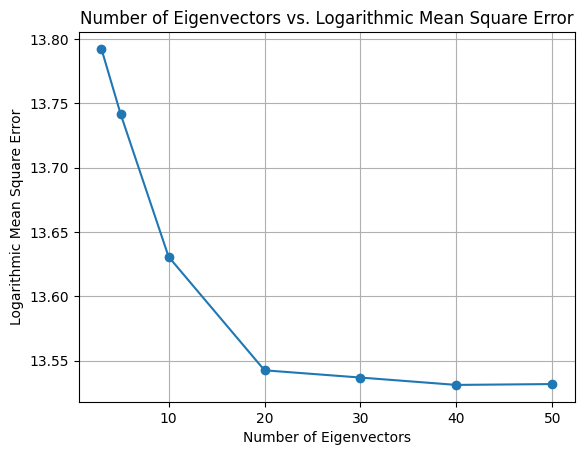

In [ ]:
# your code here
# Plot semi-log variant of the error plot
# List to store mean square errors for each number of components
mse = []
components = [3, 5, 10, 20, 30, 40, 50]

# Iterate through all the numbers of components
for numComponents in components:
    # Perform PCA on training faces with current number of components
    eigen_faces, mean_face = principalComponentAnalysis(trainFaces, numComponents)

    # Initialize total squared error
    total_squared_error = 0

    # Iterate through all test images
    for i in range(len(testFaces)):
        # Get the closest match for the current test image
        closest_image, error, predicted_class = getClass(testFaces[i], eigen_faces, mean_face, trainFaces, trainLabels)

        # Calculate squared error for the current image
        squared_error = np.sum((testFaces[i].flatten() - closest_image.flatten()) ** 2)

        # Add squared error to total squared error
        total_squared_error += squared_error

    # Calculate mean squared error for the current number of components
    mean_squared_error = total_squared_error / len(testFaces)
    mse.append(mean_squared_error)

# Take the logarithm of the MSE values
log_mse = np.log(mse)

# Plot number of eigenvectors vs. Logarithmic Mean Square Error
plt.plot(components, log_mse, marker='o')
plt.xlabel('Number of Eigenvectors')
plt.ylabel('Logarithmic Mean Square Error')
plt.title('Number of Eigenvectors vs. Logarithmic Mean Square Error')
plt.grid(True)
plt.show()
